# Data Visualisation
In this notebook, we will start with visualising the route of cyclone Debbie. Then, to check if there is a variation in temperatures, chlorophyll-a and turbidity (measured as Secchi) during the cyclonic activity, GIFs of the cyclone path and the averaged measruemnts of each variables will be created. 

In [25]:
# load the necessary packages 

import os
import scipy
import shutil
import numpy as np
import pandas as pd
import xarray as xr
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
cartopy.config['data_dir'] = os.getenv('CARTOPY_DIR', cartopy.config.get('data_dir'))

import plotly.express as px
import geopandas as gpd
import GIFs as gg

import imageio
import os
import io
import requests

import datetime as dt
from dateutil.relativedelta import *

import netCDF4
from netCDF4 import Dataset, num2date

import cmocean

import seaborn as sns
import pymannkendall as mk

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter('ignore', DeprecationWarning)

from matplotlib import pyplot as plt
%matplotlib inline
from shapely.geometry import Point
from shapely.geometry import LineString

from PIL import Image  # To create gifs


## Visualising Cyclone Debbie's path:

In [28]:
# Creating a new dataset with only lat, lon and time for Debbie
df = pd.read_csv('debbie.csv')
path = df[['lon', 'lat', 'datetime']]  # Select the columns
path

,lon,lat,datetime
0,152.00,-13.20,2017-03-22 00:00:00+00
1,151.70,-12.00,2017-03-22 06:00:00+00
2,154.00,-12.10,2017-03-22 12:00:00+00
3,152.60,-13.30,2017-03-23 00:00:00+00
4,151.60,-14.10,2017-03-23 06:00:00+00
5,151.50,-14.50,2017-03-23 12:00:00+00
6,151.30,-15.30,2017-03-23 18:00:00+00
7,151.30,-15.90,2017-03-24 00:00:00+00
8,151.60,-16.40,2017-03-24 06:00:00+00
9,151.80,-16.80,2017-03-24 12:00:00+00


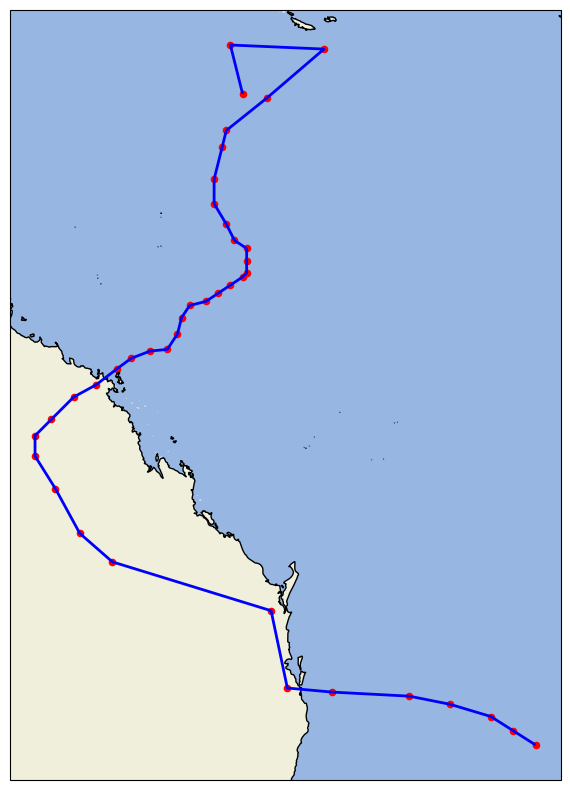

In [30]:
# Convert lon/lat to geometry points
geometry = [Point(xy) for xy in zip(path['lon'], path['lat'])]
gdf = gpd.GeoDataFrame(path, geometry=geometry)

# Create a LineString from the points
route = LineString(gdf['geometry'].values)

# Create a GeoDataFrame for the route
route_gdf = gpd.GeoDataFrame(geometry=[route], crs="EPSG:4326")

# Plot basemap with Cartopy
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)

# Plot the route on top of the basemap
route_gdf.plot(ax=ax, color='blue', linewidth=2)
gdf.plot(ax=ax, marker='o', color='red', markersize=20)

plt.show()

We would like to explore the influence of the cyclone within 50km of its route. So we create a buffer of 50 km from the cyclone route (converting to degrees)

1 degree ≈ 111 km, so 50 km ≈ 0.45 degrees

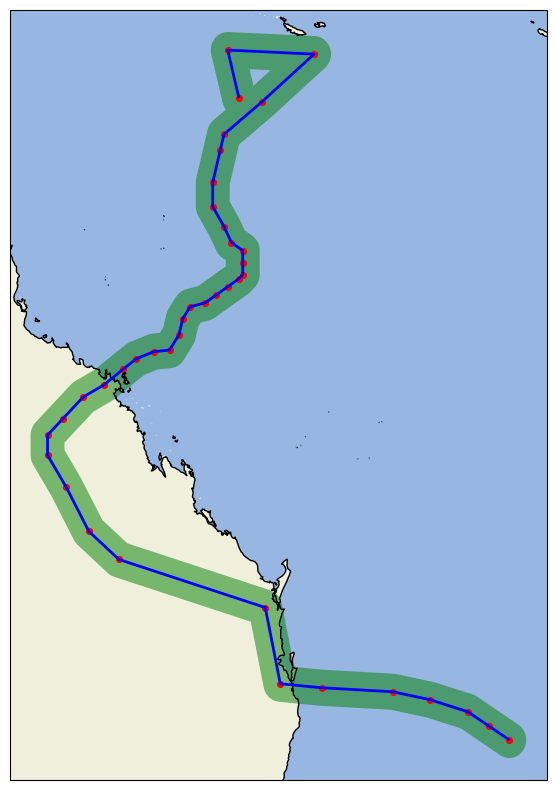

In [33]:
buffer_distance = 50 / 111  # in degrees
route_buffer = route_gdf.buffer(buffer_distance)

# plot the basemap with caropy
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot the cyclone path
route_buffer.plot(ax=ax, color='green', alpha=0.5, transform=ccrs.PlateCarree())   # buffer area
gdf.plot(ax=ax, marker='o', color='red', markersize=17, transform=ccrs.PlateCarree())   # points 
route_gdf.plot(ax=ax, color='blue', linewidth=2, transform=ccrs.PlateCarree())         # cyclone route

# Set the map extent
ax.set_extent([min(path['lon']) - 1, max(path['lon']) + 1, min(path['lat']) - 1, max(path['lat']) + 1], crs=ccrs.PlateCarree())

plt.show()

# Another way to explore the path: Interactive Map


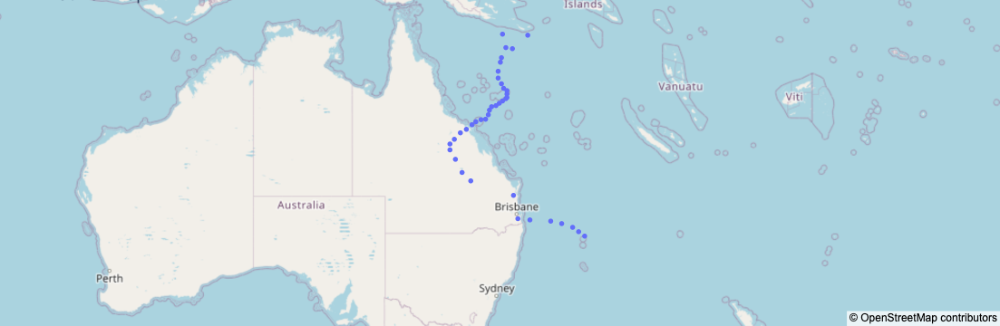

In [25]:
fig = px.scatter_mapbox(path, lat='lat', lon='lon', height=600,
                        hover_data={'datetime': True},
                        title="Path on Map")
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## After we explore the cyclone path, we load the biogeochemical data that we will use for the analysis from eReef data portal

In [35]:
# open the biogeochemical data from eReefs (netCDF file) 
month = 3
year = 2017
netCDF_datestr = str(year)+'-'+format(month, '02')

# GBR4 BIO
biofiles = ["https://thredds.ereefs.aims.gov.au/thredds/dodsC/GBR4_H2p0_B3p1_Cq3b_Dhnd/daily.nc"]

ds_bio = xr.open_mfdataset(biofiles)
ds_bio

<xarray.Dataset>
Dimensions:          (k: 17, latitude: 723, longitude: 491, time: 3073)
Coordinates:
    zc               (k) float64 dask.array<chunksize=(17,), meta=np.ndarray>
  * latitude         (latitude) float64 -28.7 -28.67 -28.64 ... -7.066 -7.036
  * longitude        (longitude) float64 142.2 142.2 142.2 ... 156.8 156.8 156.9
  * time             (time) datetime64[ns] 2010-12-01T02:00:00 ... 2019-04-30...
Dimensions without coordinates: k
Data variables: (12/108)
    TOTAL_NITROGEN   (time, k, latitude, longitude) float32 dask.array<chunksize=(3073, 17, 723, 491), meta=np.ndarray>
    alk              (time, k, latitude, longitude) float32 dask.array<chunksize=(3073, 17, 723, 491), meta=np.ndarray>
    BOD              (time, k, latitude, longitude) float32 dask.array<chunksize=(3073, 17, 723, 491), meta=np.ndarray>
    Chl_a_sum        (time, k, latitude, longitude) float32 dask.array<chunksize=(3073, 17, 723, 491), meta=np.ndarray>
    CO32             (time, k, latitude, longitude) float32 dask.array<chunksize=(3073, 17, 723, 491), meta=np.ndarray>
    DetBL_N          (time, k, latitude, longitude) float32 dask.array<chunksize=(3073, 17, 723, 491), meta=np.ndarray>
    ...               ...
    SGH_N            (time, latitude, longitude) float32 dask.array<chunksize=(3073, 723, 491), meta=np.ndarray>
    SGH_N_pr         (time, latitude, longitude) float32 dask.array<chunksize=(3073, 723, 491), meta=np.ndarray>
    SGHROOT_N        (time, latitude, longitude) float32 dask.array<chunksize=(3073, 723, 491), meta=np.ndarray>
    SGROOT_N         (time, latitude, longitude) float32 dask.array<chunksize=(3073, 723, 491), meta=np.ndarray>
    TSSM             (time, latitude, longitude) float32 dask.array<chunksize=(3073, 723, 491), meta=np.ndarray>
    Zenith2D         (time, latitude, longitude) float32 dask.array<chunksize=(3073, 723, 491), meta=np.ndarray>
Attributes: (12/19)
    Conventions:                   CF-1.0
    NCO:                           netCDF Operators version 4.7.7 (Homepage =...
    RunID:                         2
    _CoordSysBuilder:              ucar.nc2.dataset.conv.CF1Convention
    aims_ncaggregate_buildDate:    2021-09-07T22:58:30+10:00
    aims_ncaggregate_datasetId:    products__ncaggregate__ereefs__GBR4_H2p0_B...
    ...                            ...
    metadata_link:                 https://eatlas.org.au/data/uuid/61f3a6df-2...
    paramfile:                     /home/bai155/EMS_solar2/gbr4_H2p0_B3p1_Cb/...
    paramhead:                     eReefs 4 km grid. SOURCE Catchments with 2...
    technical_guide_link:          https://eatlas.org.au/pydio/public/aims-er...
    technical_guide_publish_date:  2020-08-18
    title:                         eReefs AIMS-CSIRO GBR4 BioGeoChemical 3.1 ...

In [36]:
# Define the time range for the GIFs dataset
start_date = '2017-03-22'
end_date = '2017-03-31'

# # Slice the dataset based on the time range
ds_bio_slice = ds_bio.sel(time=slice(start_date, end_date), k=-1)
ds_bio_slice

<xarray.Dataset>
Dimensions:          (latitude: 723, longitude: 491, time: 10)
Coordinates:
    zc               float64 dask.array<chunksize=(), meta=np.ndarray>
  * latitude         (latitude) float64 -28.7 -28.67 -28.64 ... -7.066 -7.036
  * longitude        (longitude) float64 142.2 142.2 142.2 ... 156.8 156.8 156.9
  * time             (time) datetime64[ns] 2017-03-22T02:00:00 ... 2017-03-31...
Data variables: (12/108)
    TOTAL_NITROGEN   (time, latitude, longitude) float32 dask.array<chunksize=(10, 723, 491), meta=np.ndarray>
    alk              (time, latitude, longitude) float32 dask.array<chunksize=(10, 723, 491), meta=np.ndarray>
    BOD              (time, latitude, longitude) float32 dask.array<chunksize=(10, 723, 491), meta=np.ndarray>
    Chl_a_sum        (time, latitude, longitude) float32 dask.array<chunksize=(10, 723, 491), meta=np.ndarray>
    CO32             (time, latitude, longitude) float32 dask.array<chunksize=(10, 723, 491), meta=np.ndarray>
    DetBL_N          (time, latitude, longitude) float32 dask.array<chunksize=(10, 723, 491), meta=np.ndarray>
    ...               ...
    SGH_N            (time, latitude, longitude) float32 dask.array<chunksize=(10, 723, 491), meta=np.ndarray>
    SGH_N_pr         (time, latitude, longitude) float32 dask.array<chunksize=(10, 723, 491), meta=np.ndarray>
    SGHROOT_N        (time, latitude, longitude) float32 dask.array<chunksize=(10, 723, 491), meta=np.ndarray>
    SGROOT_N         (time, latitude, longitude) float32 dask.array<chunksize=(10, 723, 491), meta=np.ndarray>
    TSSM             (time, latitude, longitude) float32 dask.array<chunksize=(10, 723, 491), meta=np.ndarray>
    Zenith2D         (time, latitude, longitude) float32 dask.array<chunksize=(10, 723, 491), meta=np.ndarray>
Attributes: (12/19)
    Conventions:                   CF-1.0
    NCO:                           netCDF Operators version 4.7.7 (Homepage =...
    RunID:                         2
    _CoordSysBuilder:              ucar.nc2.dataset.conv.CF1Convention
    aims_ncaggregate_buildDate:    2021-09-07T22:58:30+10:00
    aims_ncaggregate_datasetId:    products__ncaggregate__ereefs__GBR4_H2p0_B...
    ...                            ...
    metadata_link:                 https://eatlas.org.au/data/uuid/61f3a6df-2...
    paramfile:                     /home/bai155/EMS_solar2/gbr4_H2p0_B3p1_Cb/...
    paramhead:                     eReefs 4 km grid. SOURCE Catchments with 2...
    technical_guide_link:          https://eatlas.org.au/pydio/public/aims-er...
    technical_guide_publish_date:  2020-08-18
    title:                         eReefs AIMS-CSIRO GBR4 BioGeoChemical 3.1 ...

# Visualising environmental parameters: Chlorophyll-a

In [40]:
# creating chlorophyll dataset
chl_a = ds_bio_slice['Chl_a_sum']

In [42]:
# loading the csv with Debbie's path 
df = pd.read_csv('debbie.csv',parse_dates=['datetime'])
time = df['datetime'].dt.tz_localize(None)

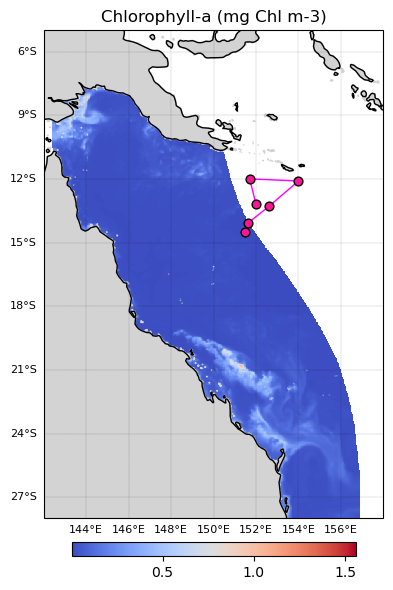

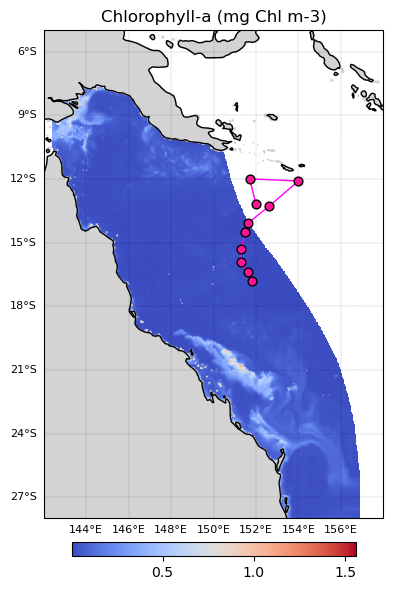

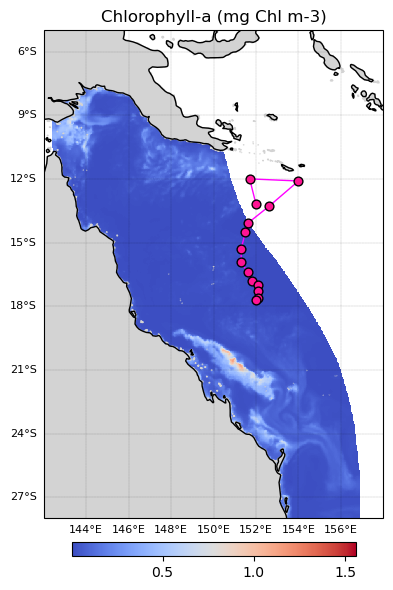

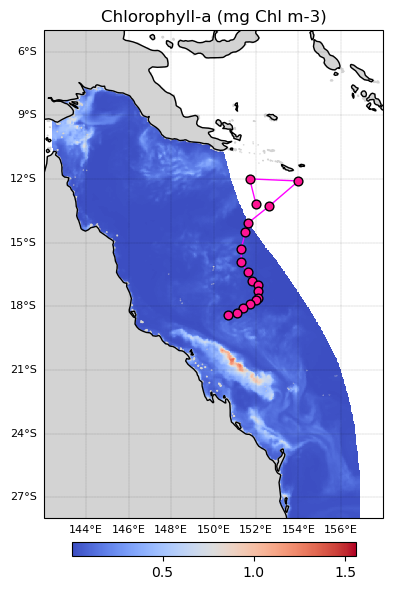

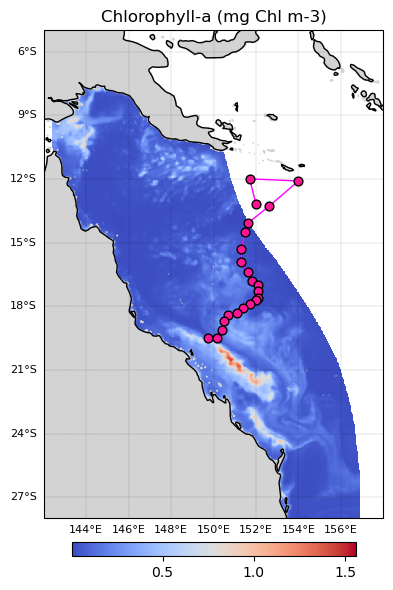

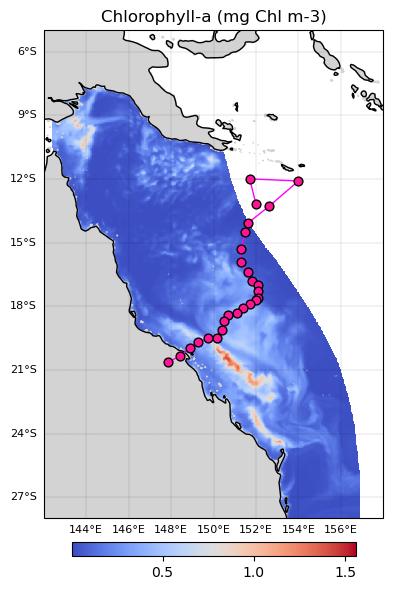

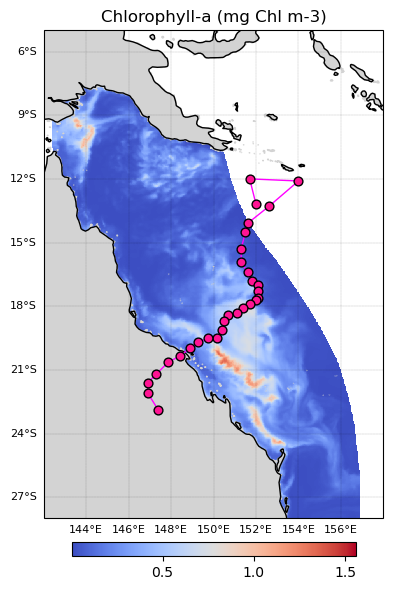

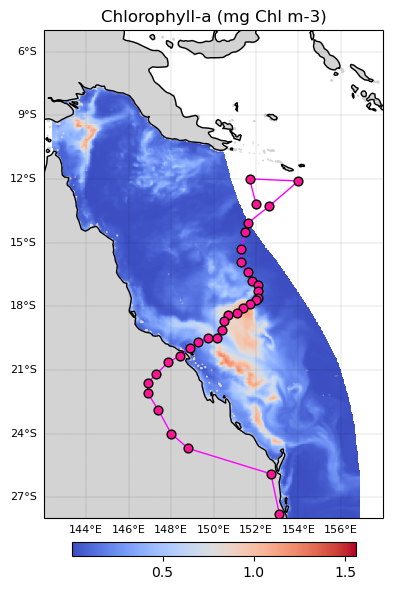

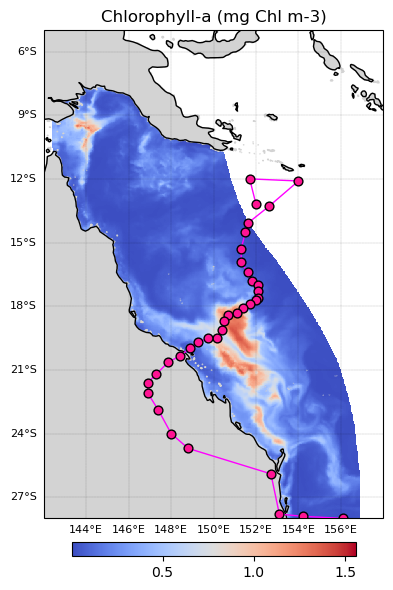

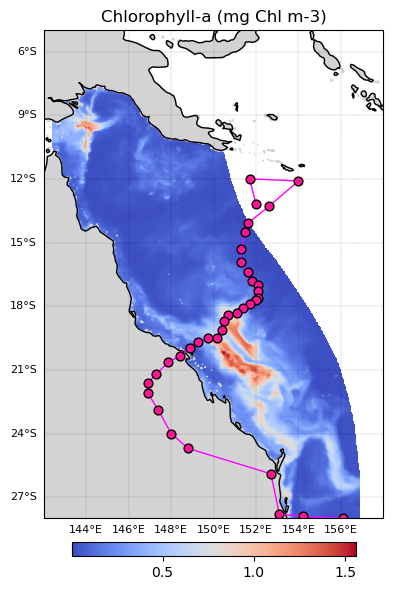

In [44]:
# plotting the path of Debbie on top of the averaged Chl_a value per day 
# graph is looping through the Debbie lon & lat and matching it to daily Chl_a values 

# Determine global vmin and vmax for the entire time range to adjust the map's scale 
vmin = chl_a.min().compute()
vmax = chl_a.max().compute()

output_folder = 'Chl_a'
os.makedirs(output_folder, exist_ok=True)
filenames = []
id0 = 0
idspan = 2
t0 = time[id0]
for days in range(10):

    t1 = time[id0] # 0 # 3
    t2 = time[idspan] # 2 # 6
    id0 = idspan + 1
    idspan = id0 + 3
    # print(t1,t2)
    mychl = chl_a.sel(time=slice(t1, t2))
    
    # Defining the figure
    fig = plt.figure(figsize=(5, 6), facecolor='w', edgecolor='k')
    ax = plt.axes(projection=ccrs.PlateCarree())
    

    cf = mychl.plot( 
        transform=ccrs.PlateCarree(), cmap='coolwarm',
        vmin = vmin, vmax = vmax,
        add_colorbar=False
    )
    cbar = fig.colorbar(cf, ax=ax, fraction=0.027, pad=0.045, 
                    orientation="horizontal")
    # Add map features with Cartopy 
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m', 
                                                edgecolor='face', 
                                                facecolor='lightgray'))
    ax.coastlines(linewidth=1)

    # and extent
    ax.set_extent([142, 158, -28, -5], 
                  ccrs.PlateCarree())
    
    ax.scatter(df.lon[0:idspan],df.lat[0:idspan], c='deeppink', s=40, edgecolors='k', linewidth=1, 
               transform=ccrs.PlateCarree(),zorder=10)
    ax.plot(df.lon[0:idspan],df.lat[0:idspan], transform=ccrs.PlateCarree(), linewidth=1, 
            c='magenta',zorder=9)
    
    # Plot lat/lon grid 
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.1, color='k', alpha=1, 
                      linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 8}
    gl.ylabel_style = {'size': 8} 
    
    plt.title('Chlorophyll-a (mg Chl m-3)')
    plt.tight_layout()
    plt.show()
    filenames.append(os.path.join(output_folder, f'Chl_a_map_day_{days}.png'))
    fig.savefig(os.path.join(output_folder, f'Chl_a_map_day_{days}.png'), dpi=300)
    plt.close(fig)
    

In [45]:
# Create a GIF using the saved images
with imageio.get_writer('chl_a_animation.gif', mode='I', duration=0.5) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

print("GIF created successfully!")

GIF created successfully!


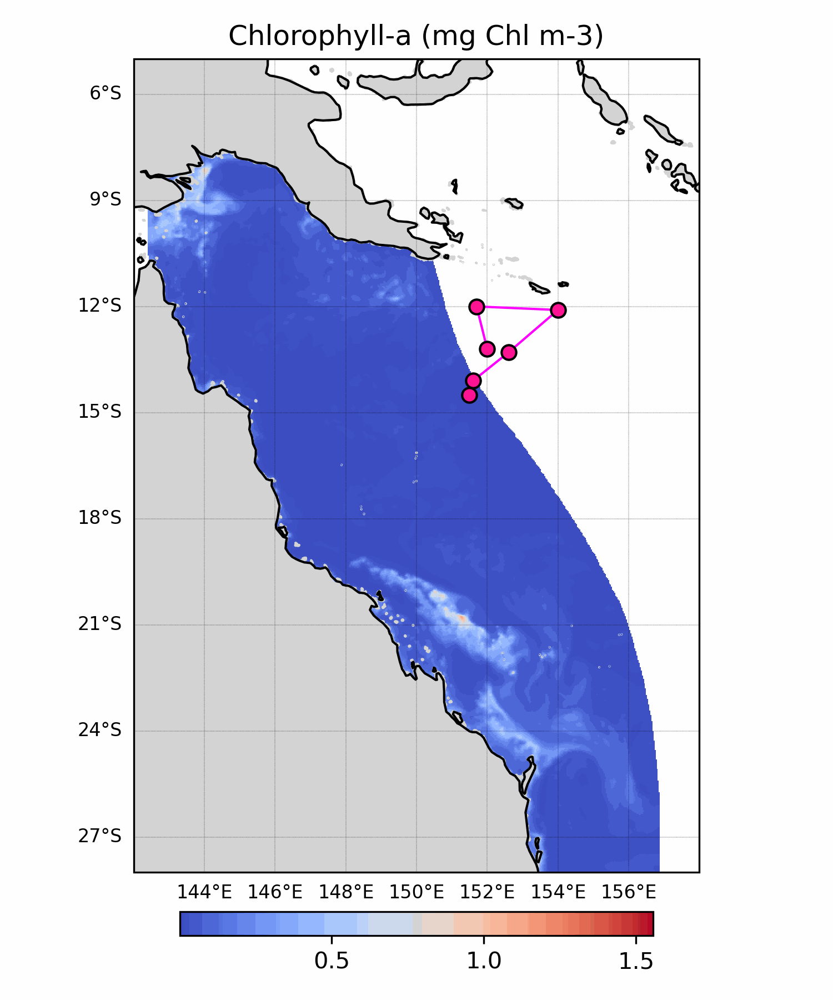

In [31]:
from IPython.display import Image

# Display the GIF
Image(filename='chl_a_animation.gif')

# Visualising environmental parameters: Sea Surface Temperature (SST)

In [46]:
# Now, we will move on the visualise the temperature
# creating temperature dataset
temp = ds_bio_slice['temp']
temp

<xarray.DataArray 'temp' (time: 10, latitude: 723, longitude: 491)>
dask.array<getitem, shape=(10, 723, 491), dtype=float32, chunksize=(10, 723, 491), chunktype=numpy.ndarray>
Coordinates:
    zc         float64 dask.array<chunksize=(), meta=np.ndarray>
  * latitude   (latitude) float64 -28.7 -28.67 -28.64 ... -7.096 -7.066 -7.036
  * longitude  (longitude) float64 142.2 142.2 142.2 142.3 ... 156.8 156.8 156.9
  * time       (time) datetime64[ns] 2017-03-22T02:00:00 ... 2017-03-31T02:00:00
Attributes:
    short_name:   temp
    units:        degrees C
    long_name:    Temperature
    _ChunkSizes:  [  1   1 133 491]

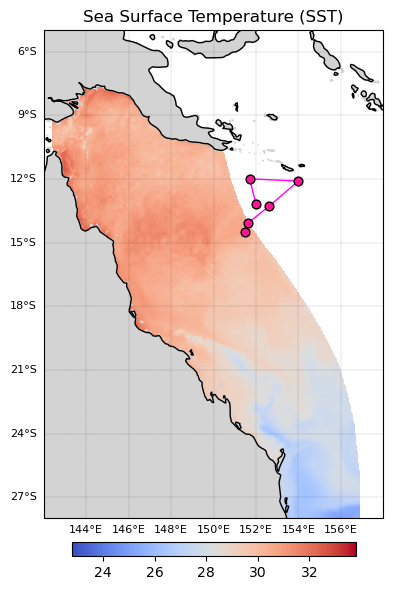

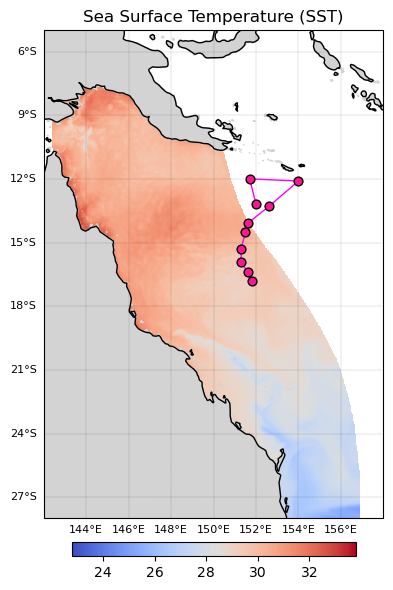

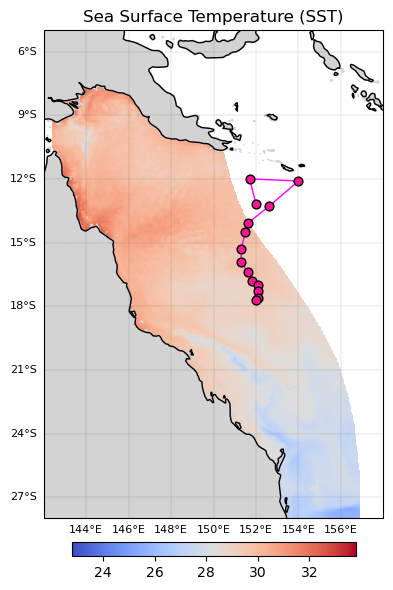

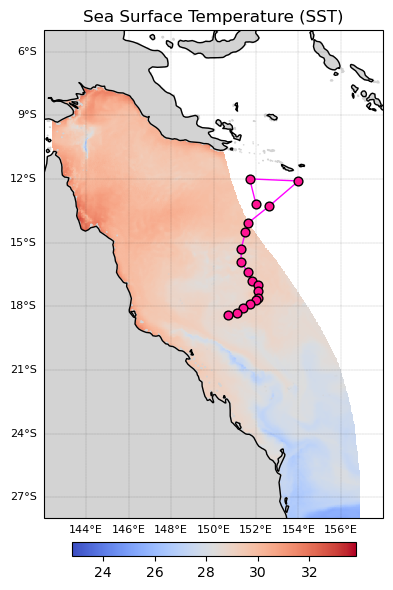

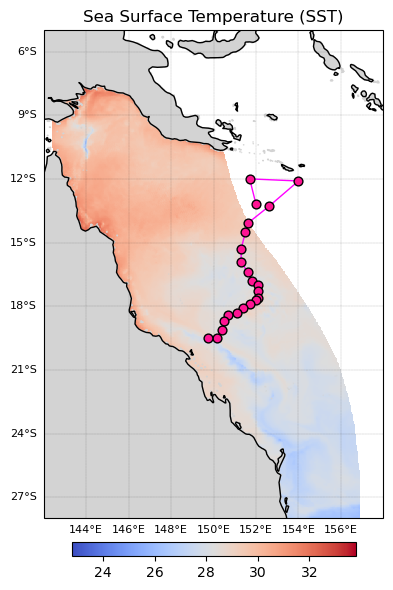

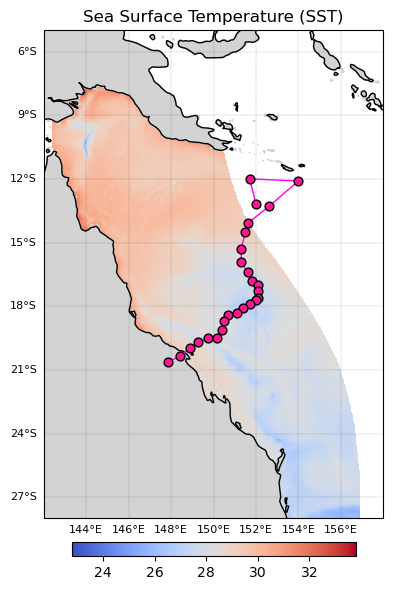

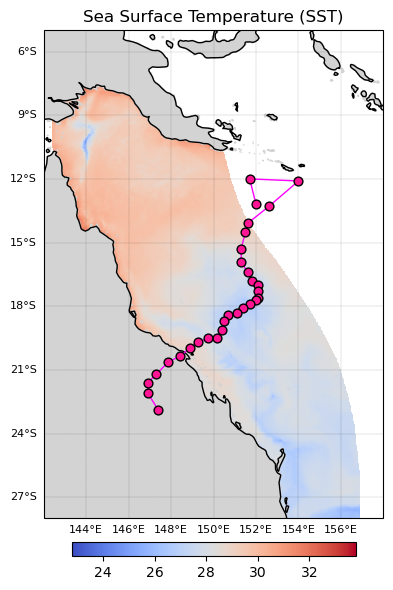

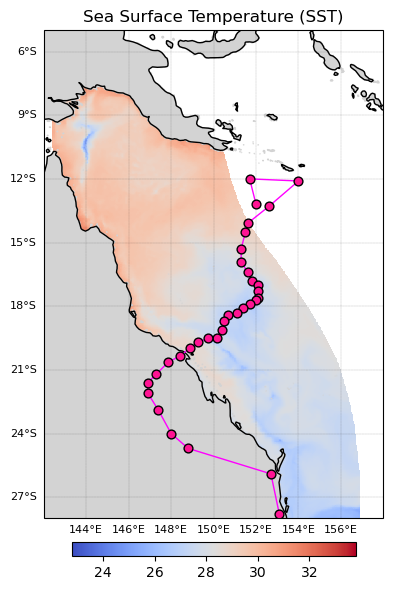

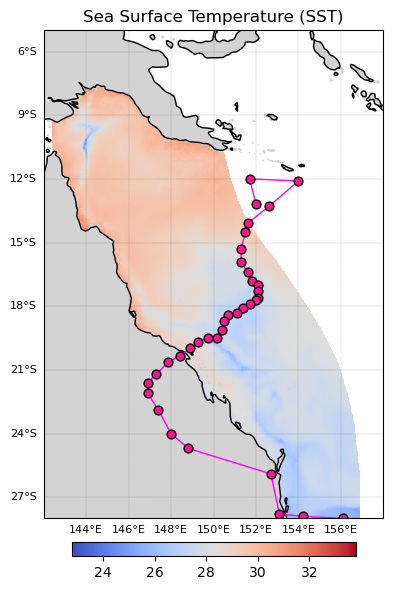

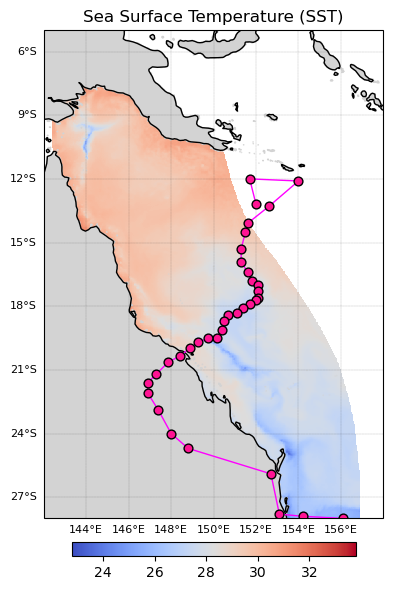

In [47]:
# Determine global vmin and vmax for the entire time range to adjust the map's scale 
vmin = temp.min().compute()
vmax = temp.max().compute()

output_folder = 'Temp'
os.makedirs(output_folder, exist_ok=True)
filenames = []
id0 = 0
idspan = 2
t0 = time[id0]
for days in range(10):

    t1 = time[id0] # 0 # 3
    t2 = time[idspan] # 2 # 6
    id0 = idspan + 1
    idspan = id0 + 3
    # print(t1,t2)
    mytemp = temp.sel(time=slice(t1, t2))
    
    # Defining the figure
    fig = plt.figure(figsize=(5, 6), facecolor='w', edgecolor='k')
    ax = plt.axes(projection=ccrs.PlateCarree())
    
    cf = mytemp.plot( 
        transform=ccrs.PlateCarree(), cmap='coolwarm',
        vmin = vmin, vmax = vmax,
        add_colorbar=False
    )
    
    cbar = fig.colorbar(cf, ax=ax, fraction=0.027, pad=0.045, 
                    orientation="horizontal")

    # Add map features with Cartopy 
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m', 
                                                edgecolor='face', 
                                                facecolor='lightgray'))
    ax.coastlines(linewidth=1)

    # and extent
    ax.set_extent([142, 158, -28, -5], 
                  ccrs.PlateCarree())
    
    ax.scatter(df.lon[0:idspan],df.lat[0:idspan], c='deeppink', s=40, edgecolors='k', linewidth=1, 
               transform=ccrs.PlateCarree(),zorder=10)
    ax.plot(df.lon[0:idspan],df.lat[0:idspan], transform=ccrs.PlateCarree(), linewidth=1, 
            c='magenta',zorder=9)
    
    # Plot lat/lon grid 
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.1, color='k', alpha=1, 
                      linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 8}
    gl.ylabel_style = {'size': 8} 
    
    plt.title('Sea Surface Temperature (SST)')
    plt.tight_layout()
    plt.show()
    filenames.append(os.path.join(output_folder, f'Temp_map_day_{days}.png'))
    fig.savefig(os.path.join(output_folder, f'Temp_map_day_{days}.png'), dpi=300)
    plt.close(fig)

In [48]:
# Create a GIF using the saved images
with imageio.get_writer('temp_path_animation.gif', mode='I', duration=0.5) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

print("GIF created successfully!")

GIF created successfully!


In [49]:
# Lastly, creating visualisation of Secchi during the cyclone period:
# creating secchi datase 
sech = ds_bio['Secchi']
# Calculate the daily average for secchi values  
daily_mean_secchi = ds_bio_slice.Secchi.resample(time='1D').mean()

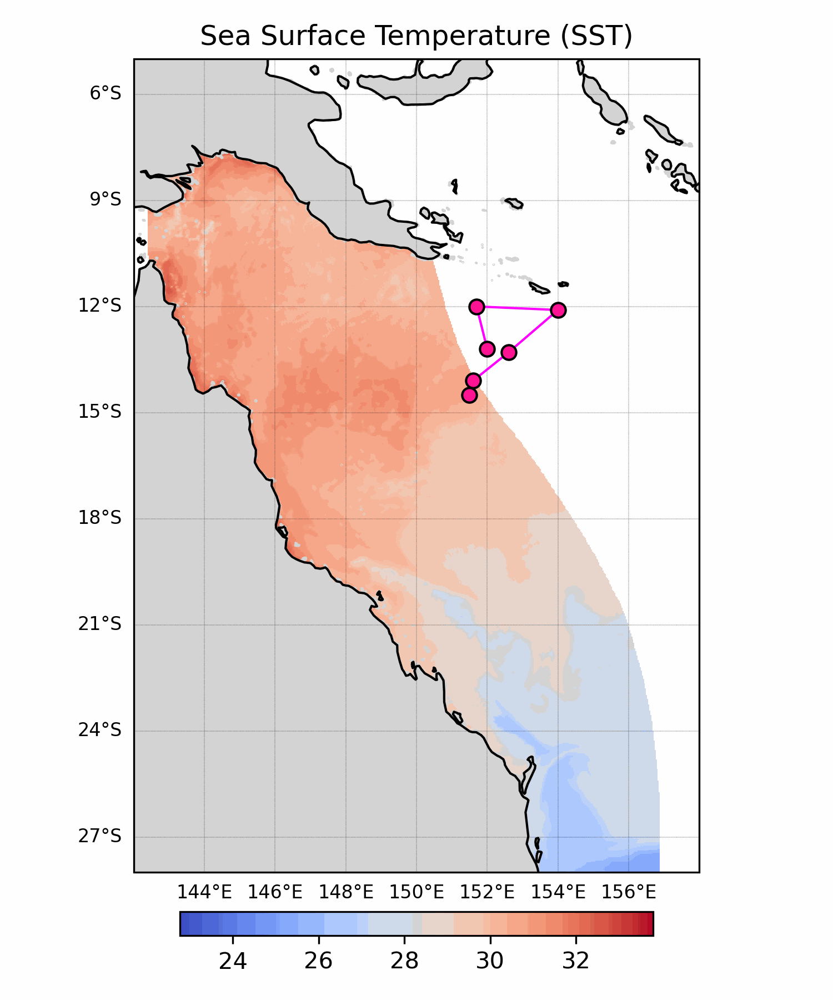

In [50]:
from IPython.display import Image

# Display the GIF
Image(filename='temp_path_animation.gif')

# Visualising environmental parameters: Turbidity (as Secchi)

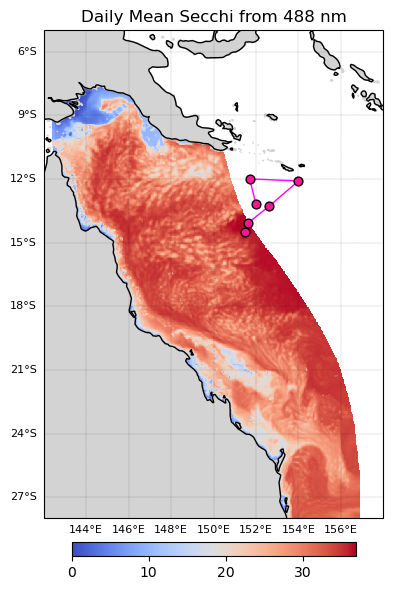

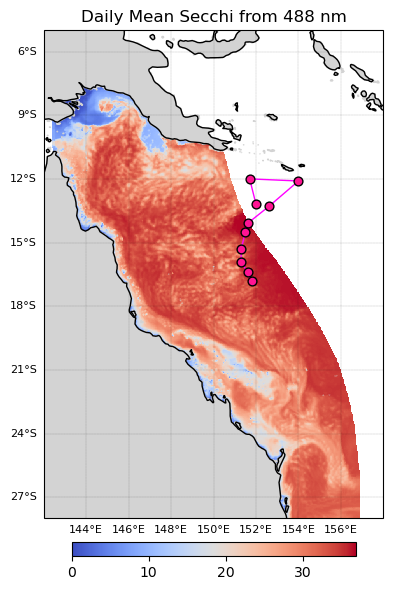

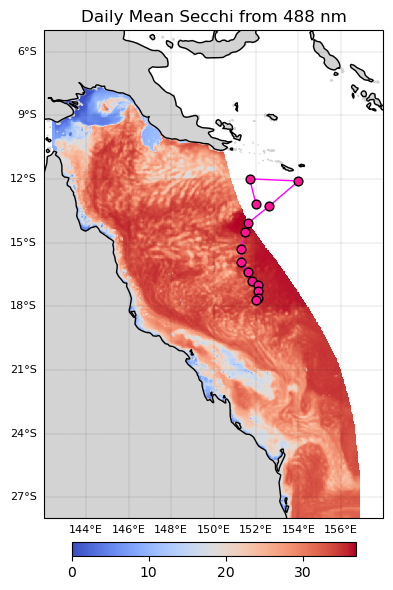

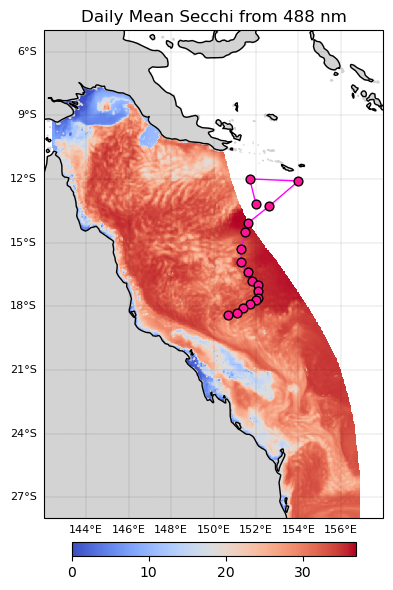

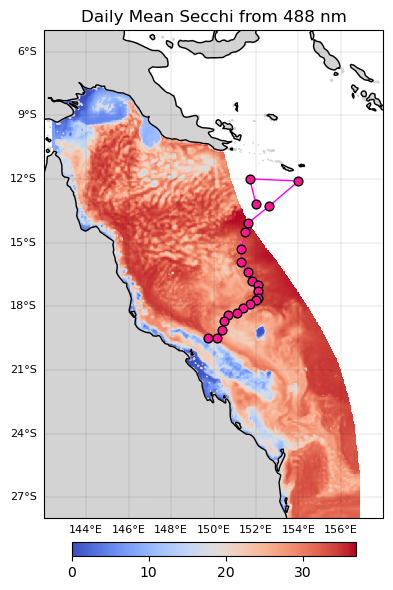

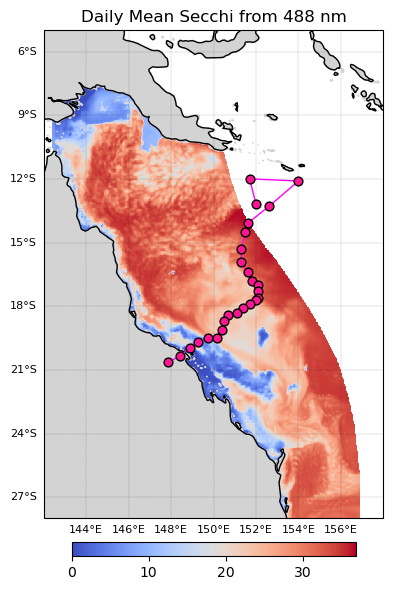

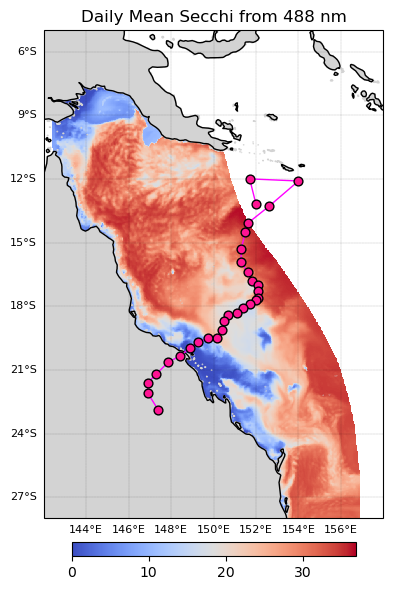

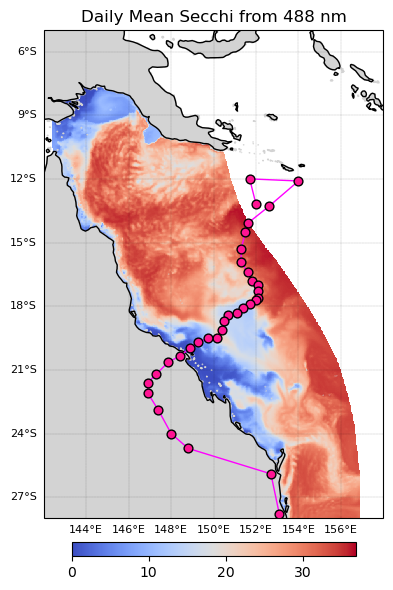

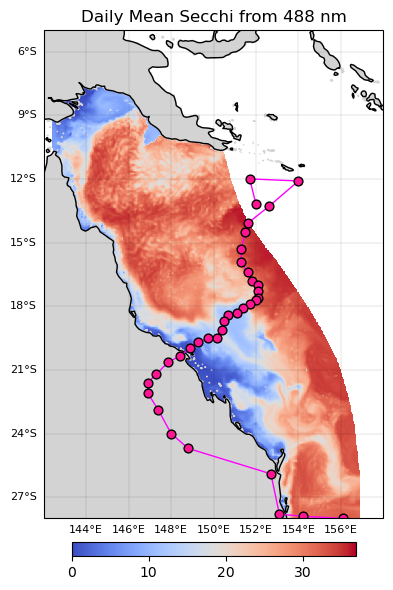

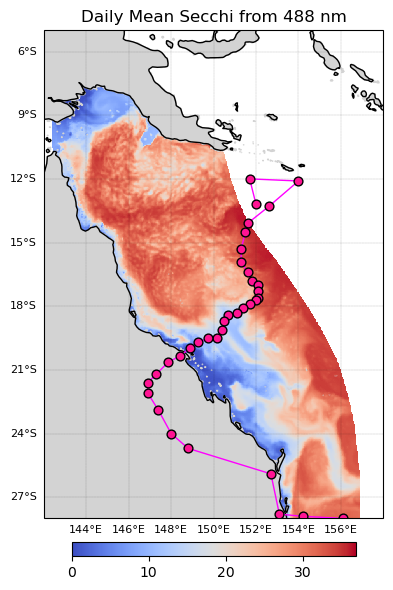

In [58]:
# Determine global vmin and vmax for the entire time range
vmin = daily_mean_secchi.min().compute()
vmax = daily_mean_secchi.max().compute()

output_folder = 'Secchi_path'
os.makedirs(output_folder, exist_ok=True)
filenames = []
id0 = 0
idspan = 2
t0 = time[id0]
for days in range(10):

    t1 = time[id0] # 0 # 3
    t2 = time[idspan] # 2 # 6
    id0 = idspan + 1
    idspan = id0 + 3
    # print(t1,t2)
    mysech = daily_mean_secchi.sel(time=slice(t1, t2))

# Defining the figure
    fig = plt.figure(figsize=(5, 6), facecolor='w', edgecolor='k')
    ax = plt.axes(projection=ccrs.PlateCarree())
    

    cf = mysech.plot( 
        transform=ccrs.PlateCarree(), cmap='coolwarm',
        vmin = vmin, vmax = vmax,
        add_colorbar=False
    )
    cbar = fig.colorbar(cf, ax=ax, fraction=0.027, pad=0.045, 
                    orientation="horizontal")
# Add map features with Cartopy 
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m', 
                                                edgecolor='face', 
                                                facecolor='lightgray'))
    ax.coastlines(linewidth=1)

    # and extent
    ax.set_extent([142, 158, -28, -5], 
                  ccrs.PlateCarree())
    
    ax.scatter(df.lon[0:idspan],df.lat[0:idspan], c='deeppink', s=40, edgecolors='k', linewidth=1, 
               transform=ccrs.PlateCarree(),zorder=10)
    ax.plot(df.lon[0:idspan],df.lat[0:idspan], transform=ccrs.PlateCarree(), linewidth=1, 
            c='magenta',zorder=9)
    
    # Plot lat/lon grid 
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.1, color='k', alpha=1, 
                      linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 8}
    gl.ylabel_style = {'size': 8} 
    
    plt.title('Daily Mean Secchi from 488 nm')
    plt.tight_layout()
    plt.show()
    filenames.append(os.path.join(output_folder, f'secchi_map_day_{days}.png'))
    fig.savefig(os.path.join(output_folder, f'secchi_map_day_{days}.png'), dpi=300)
    plt.close(fig)

In [59]:
# Create a GIF using the saved images
with imageio.get_writer('Secchi_path_animation.gif', mode='I', duration=0.5) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

print("GIF created successfully!")

GIF created successfully!


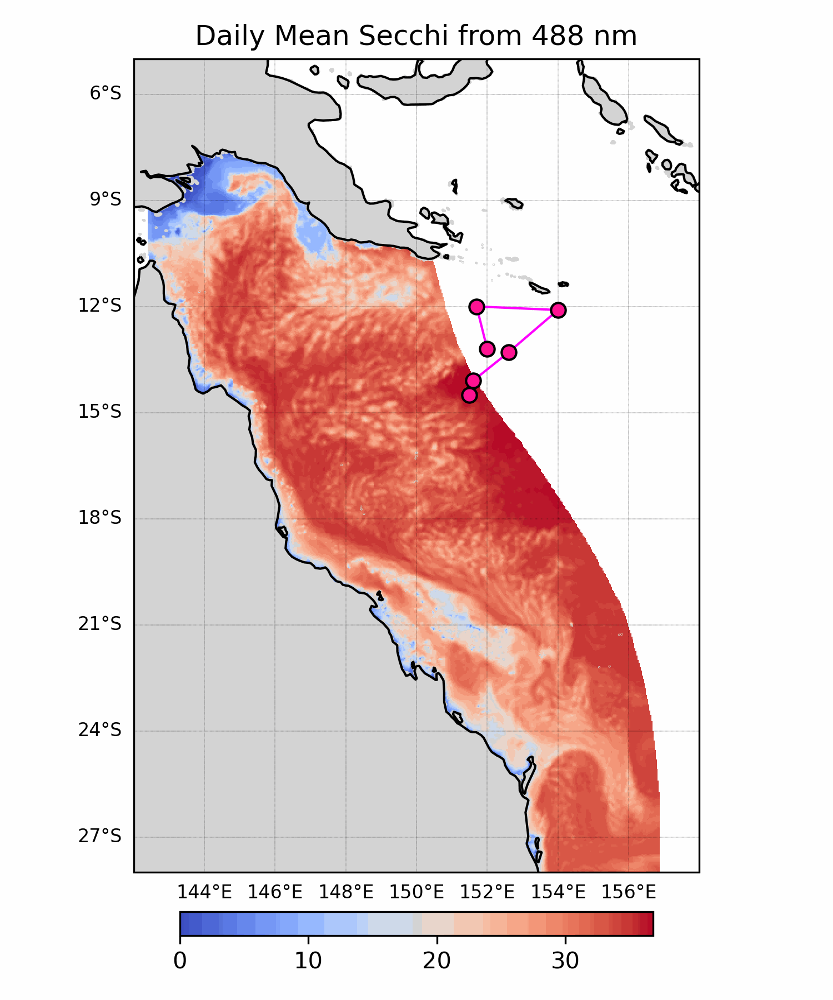

In [60]:
from IPython.display import Image

# Display the GIF
Image(filename='Secchi_path_animation.gif')